In [5]:
import rasterio as rio
import numpy as np
import matplotlib.pyplot as plt
import os
import glob

label_dir = "/home/user/data_shared/masks/PASTIS/T32ULU/TARGET_40000.tif"
img_path = "/home/user/data_shared/T32ULU/20180917T103019.tif"

label_ds = rio.open(label_dir)
label = label_ds.read(1)

bounds = label_ds.bounds
bounds

img_ds = rio.open(img_path)
window = rio.windows.from_bounds(*bounds, transform=img_ds.transform)
img = img_ds.read(window=window)
img.shape

row_start = int(window.row_off)
col_start = int(window.col_off)
row_end = int(window.row_off + window.height)
col_end = int(window.col_off + window.width)
(row_start, row_end, col_start, col_end)

# Corner indices from bounds (rows, cols).
row_min, col_min = rio.transform.rowcol(img_ds.transform, bounds.left, bounds.top)
row_max, col_max = rio.transform.rowcol(img_ds.transform, bounds.right, bounds.bottom)
((row_min, col_min), (row_max, col_max))

((2743, 9142), (2871, 9270))

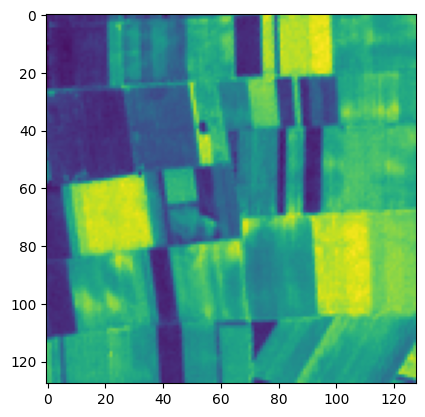

In [ ]:
img = rio.open(img_path)
img_read = img.read()
plt.imshow(img_read[2, 2743:2743+128, 9142:9142+128])


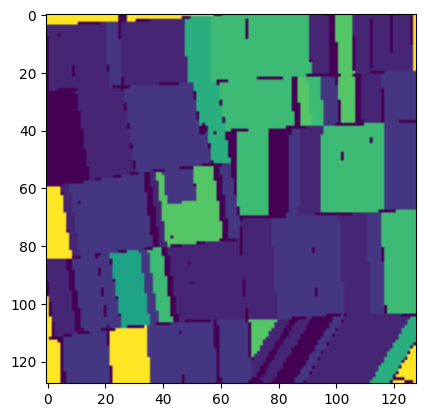

In [9]:
plt.imshow(label)

In [10]:
import geopandas as gpd

metadata_path = "/home/user/data_shared/masks/PASTIS/metadata.geojson"
metadata_gdf = gpd.read_file(metadata_path)
metadata_gdf.head()

,Fold,ID_PATCH,N_Parcel,Parcel_Cover,TILE,dates-S1A,dates-S1D,dates-S2,id,geometry
0,1,10000,119,0.808032,t30uxv,"{ ""0"": 20181004, ""1"": 20181010, ""2"": 20181016,...","{ ""0"": 20181002, ""1"": 20181008, ""2"": 20181014,...","{ ""0"": 20180924, ""1"": 20180929, ""2"": 20181004,...",10000,"MULTIPOLYGON (((391504.736 6956805.915, 392781..."
1,2,10001,111,0.501986,t30uxv,"{ ""0"": 20181004, ""1"": 20181010, ""2"": 20181016,...","{ ""0"": 20181002, ""1"": 20181008, ""2"": 20181014,...","{ ""0"": 20180924, ""1"": 20180929, ""2"": 20181004,...",10001,"MULTIPOLYGON (((367628.562 6880296.822, 368905..."
2,4,10002,131,0.638722,t30uxv,"{ ""0"": 20181004, ""1"": 20181010, ""2"": 20181016,...","{ ""0"": 20181002, ""1"": 20181008, ""2"": 20181014,...","{ ""0"": 20180924, ""1"": 20180929, ""2"": 20181004,...",10002,"MULTIPOLYGON (((388950.375 6957003.181, 390227..."
3,5,10003,75,0.866824,t30uxv,"{ ""0"": 20181004, ""1"": 20181010, ""2"": 20181016,...","{ ""0"": 20181002, ""1"": 20181008, ""2"": 20181014,...","{ ""0"": 20180924, ""1"": 20180929, ""2"": 20181004,...",10003,"MULTIPOLYGON (((455228.326 6917189.74, 456504...."
4,4,10004,46,0.204906,t30uxv,"{ ""0"": 20181004, ""1"": 20181010, ""2"": 20181016,...","{ ""0"": 20181002, ""1"": 20181008, ""2"": 20181014,...","{ ""0"": 20180924, ""1"": 20180929, ""2"": 20181004,...",10004,"MULTIPOLYGON (((364779.509 6910052.243, 366056..."


In [15]:
target_id = 40000


if "ID_PATCH" in metadata_gdf.columns:
    match = metadata_gdf[metadata_gdf["ID_PATCH"] == target_id]
else:
    numeric_cols = [
        col for col in metadata_gdf.columns
        if metadata_gdf[col].dtype.kind in "iu"
    ]
    match = metadata_gdf[metadata_gdf[numeric_cols].eq(target_id).any(axis=1)]

match["Fold"].values[0].dtype

dtype('int32')

Building train image label pairs: 100%|██████████| 556/556 [04:57<00:00,  1.87it/s]


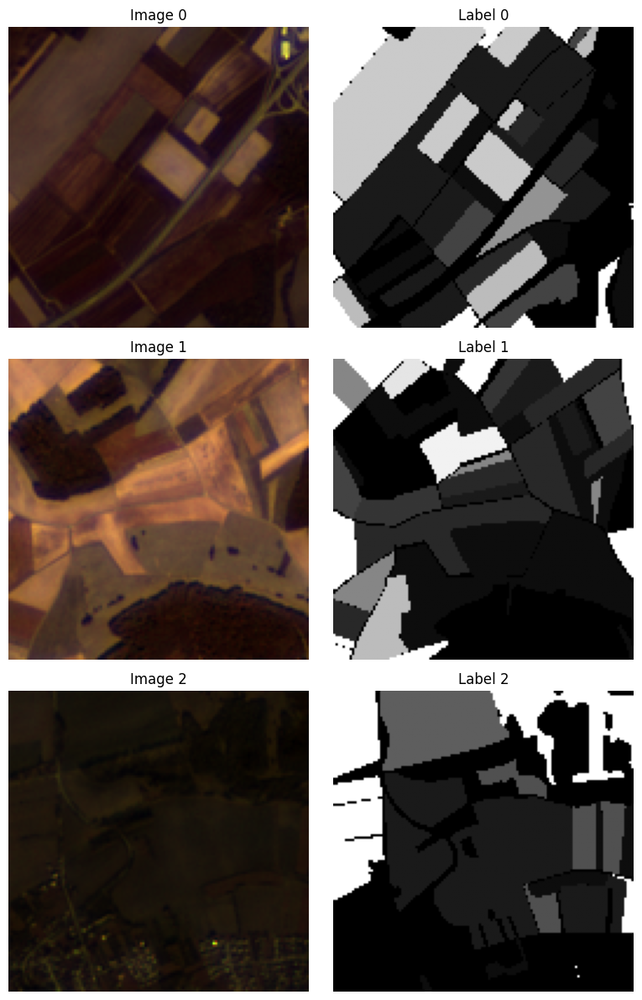

In [17]:
from torch.utils.data import DataLoader
from datasets import PASTIS

top_dir = "/home/user/data_shared"
s2_tile = "T32ULU"
labels_path = "/home/user/data_shared/masks/PASTIS/T32ULU"
metadata_path = "/home/user/data_shared/masks/PASTIS/metadata.geojson"
train_val_key = "train"
val_folds = [2, 3]

pastis_ds = PASTIS(
    top_dir=top_dir,
    s2_tile=s2_tile,
    labels_path=labels_path,
    metadata_path=metadata_path,
    train_val_key=train_val_key,
    val_folds=val_folds,
 )

pastis_loader = DataLoader(pastis_ds, batch_size=1, shuffle=True)

def _to_rgb(img):
    if img.shape[0] >= 3:
        rgb = np.stack([img[2], img[1], img[0]], axis=-1)
        rgb = (rgb - rgb.min()) / (rgb.max() - rgb.min() + 1e-6)
        return rgb
    return img[0]

fig, axes = plt.subplots(3, 2, figsize=(8, 12))
for i, batch in enumerate(pastis_loader):
    if i >= 3:
        break
    s2 = batch["s2data"][0].numpy()
    label = batch["label"][0].numpy()
    axes[i, 0].imshow(_to_rgb(s2))
    axes[i, 0].set_title(f"Image {i}")
    axes[i, 0].axis("off")
    label_img = label[0] if label.ndim == 3 else label
    axes[i, 1].imshow(label_img, cmap="gray")
    axes[i, 1].set_title(f"Label {i}")
    axes[i, 1].axis("off")

plt.tight_layout()

In [3]:
import os
import rasterio
from rasterio.warp import transform_bounds

def check_pair(img_path, label_path):
    with rasterio.open(img_path) as img, rasterio.open(label_path) as lab:
        print("IMG :", os.path.basename(img_path))
        print("LAB :", os.path.basename(label_path))
        print("IMG CRS:", img.crs, "  RES:", img.res, "  SHAPE:", (img.height, img.width))
        print("LAB CRS:", lab.crs, "  RES:", lab.res, "  SHAPE:", (lab.height, lab.width))

        # Compare bounds in same CRS
        img_bounds = img.bounds
        lab_bounds = lab.bounds
        if img.crs != lab.crs:
            lab_bounds_in_img = transform_bounds(lab.crs, img.crs, *lab_bounds, densify_pts=21)
            print("IMG bounds:", img_bounds)
            print("LAB bounds (reproj->IMG CRS):", lab_bounds_in_img)
        else:
            print("IMG bounds:", img_bounds)
            print("LAB bounds:", lab_bounds)

        print("IMG transform:\n", img.transform)
        print("LAB transform:\n", lab.transform)
        print("-"*80)

# Example:
check_pair("/home/user/data_shared/T11SMT/20190504T182921.tif",
           "/home/user/data_shared/masks/BurnScars/T11SMT/aligned_subsetted_512x512_HLS.S30.T11SMT.2019294.v1.4.mask.tif")

IMG : 20190504T182921.tif
LAB : aligned_subsetted_512x512_HLS.S30.T11SMT.2019294.v1.4.mask.tif
IMG CRS: EPSG:32611   RES: (10.0, 10.0)   SHAPE: (10980, 10980)
LAB CRS: EPSG:32611   RES: (10.0, 10.0)   SHAPE: (1536, 1536)
IMG bounds: BoundingBox(left=399960.0, bottom=3690240.0, right=509760.0, top=3800040.0)
LAB bounds: BoundingBox(left=468240.0, bottom=3704490.0, right=483600.0, top=3719850.0)
IMG transform:
 | 10.00, 0.00, 399960.00|
| 0.00,-10.00, 3800040.00|
| 0.00, 0.00, 1.00|
LAB transform:
 | 10.00, 0.00, 468240.00|
| 0.00,-10.00, 3719850.00|
| 0.00, 0.00, 1.00|
--------------------------------------------------------------------------------


Building val image label pairs: 100%|██████████| 2/2 [00:00<00:00,  8.07it/s]


Found 288 samples for val with >0% burned area
Average burned percentage across samples: 2.27%


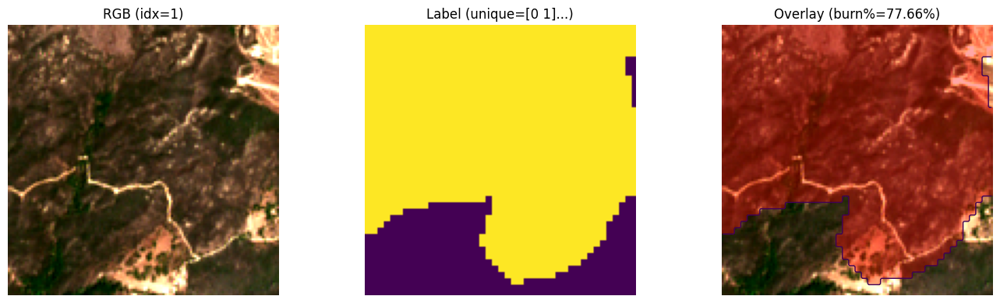

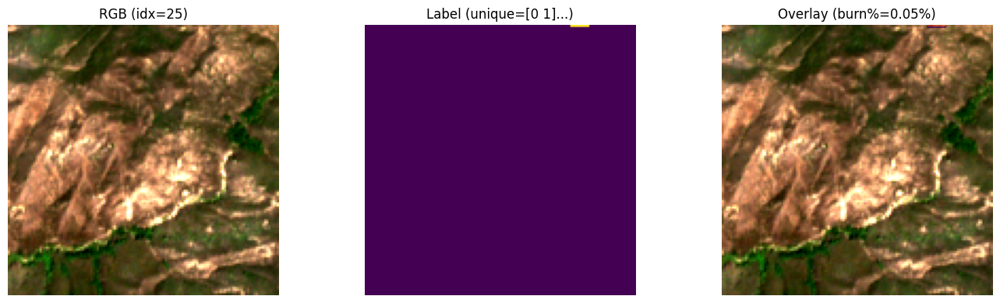

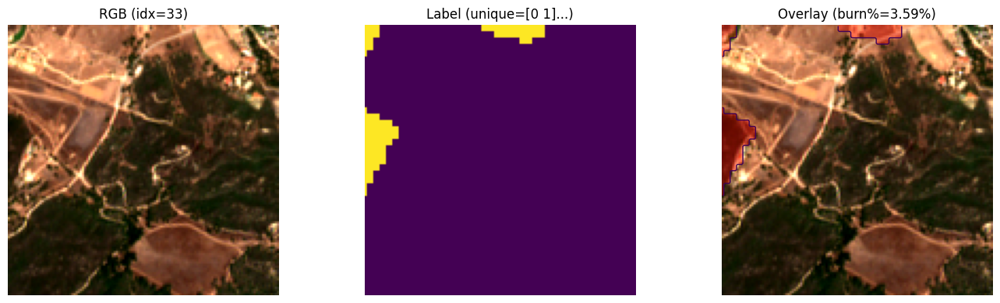

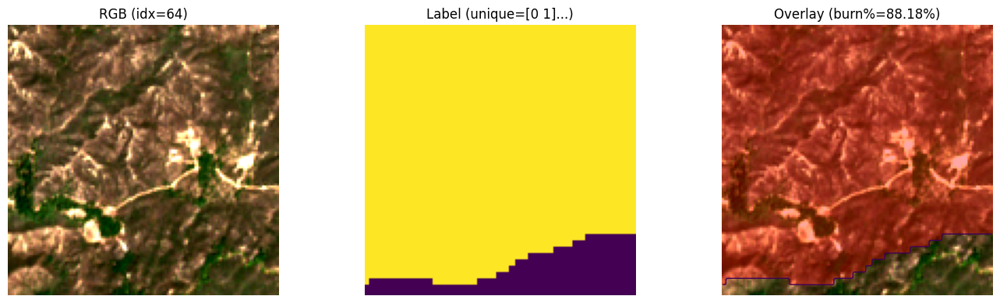

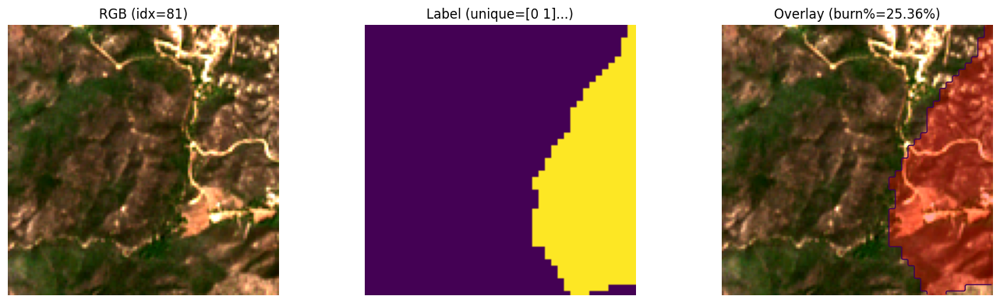

...

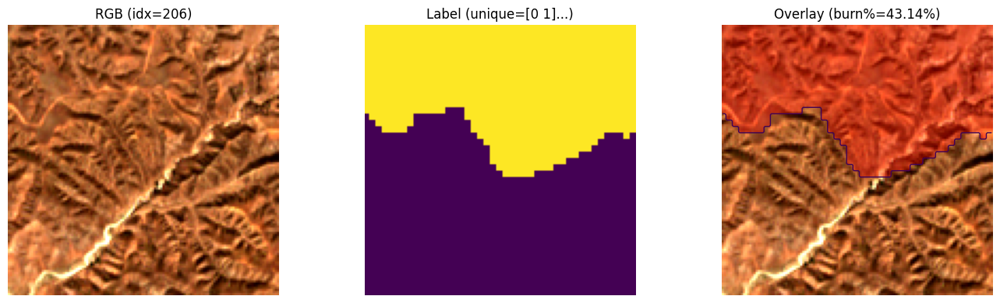

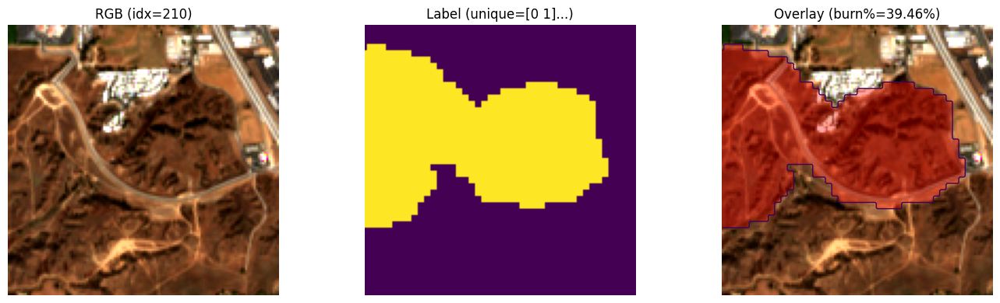

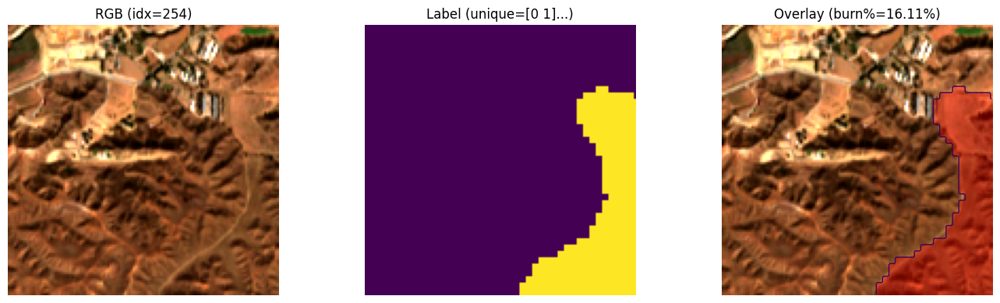

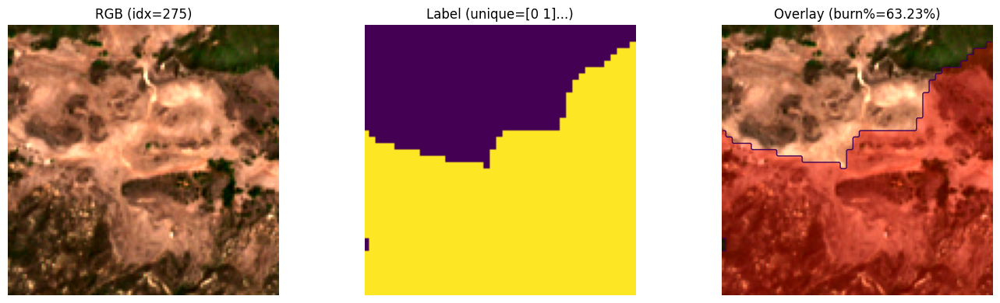

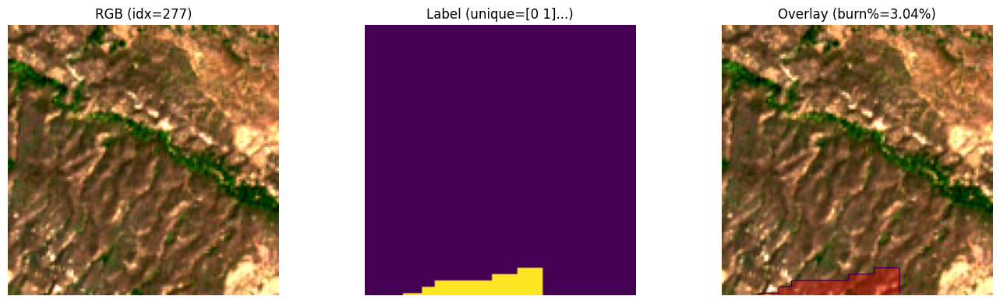

In [12]:
import numpy as np
import matplotlib.pyplot as plt

from datasets import BurnScars

def _to_rgb(s2_patch, rgb_idx=(3,2,1), percentiles=(2, 98)):
    """
    s2_patch: (C,H,W)
    rgb_idx:  0-based band indices inside your stored array.
             Default (3,2,1) assumes [B01,B02,B03,B04,...] style ordering where
             B04=3, B03=2, B02=1. Adjust if your channel order differs.
    """
    C, H, W = s2_patch.shape
    r, g, b = rgb_idx
    rgb = np.stack([s2_patch[r], s2_patch[g], s2_patch[b]], axis=-1).astype(np.float32)

    lo, hi = np.percentile(rgb, percentiles)
    rgb = np.clip((rgb - lo) / (hi - lo + 1e-6), 0, 1)
    return rgb

def show_sample_overlay(dataset, idx, rgb_idx=(3,2,1), mask_band=0):
    s = dataset.samples[idx]
    s2 = s["s2_img_patch"]          # (C,128,128)
    lab = s["label"]                # (1,128,128) or (H,W) depending on read()

    if lab.ndim == 3:
        lab2 = lab[mask_band]
    else:
        lab2 = lab

    # handle your -1 convention
    lab2 = lab2.copy()
    lab2[lab2 == -1] = 0

    rgb = _to_rgb(s2, rgb_idx=rgb_idx)

    fig, axes = plt.subplots(1, 3, figsize=(14, 4))

    axes[0].imshow(rgb)
    axes[0].set_title(f"RGB (idx={idx})")
    axes[0].axis("off")

    axes[1].imshow(lab2, vmin=0)
    axes[1].set_title(f"Label (unique={np.unique(lab2)[:10]}...)")
    axes[1].axis("off")

    axes[2].imshow(rgb)
    # red overlay where burned>0
    m = (lab2 > 0)
    overlay = np.zeros((m.shape[0], m.shape[1], 4), dtype=np.float32)
    overlay[m] = (1, 0, 0, 0.35)  # red with alpha
    axes[2].imshow(overlay)
    # contour to see edges clearly
    axes[2].contour(m.astype(np.uint8), levels=[0.5], linewidths=1)
    axes[2].set_title(f"Overlay (burn%={s['burned_percentage']*100:.2f}%)")
    axes[2].axis("off")

    plt.tight_layout()
    plt.show()
ds_train = BurnScars(
    top_dir="/home/user/data_shared",
    s2_tile="T11SMT",
    labels_path="/home/user/data_shared/masks/BurnScars",
    train_val_key="val",
)

# Example:
for i in range(len(ds_train)):
    if ds_train.samples[i]["burned_percentage"] > 0:
        show_sample_overlay(ds_train, idx=i, rgb_idx=(3,2,1))

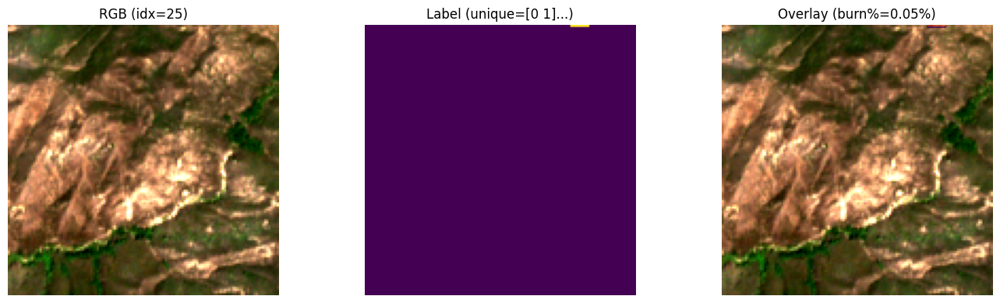

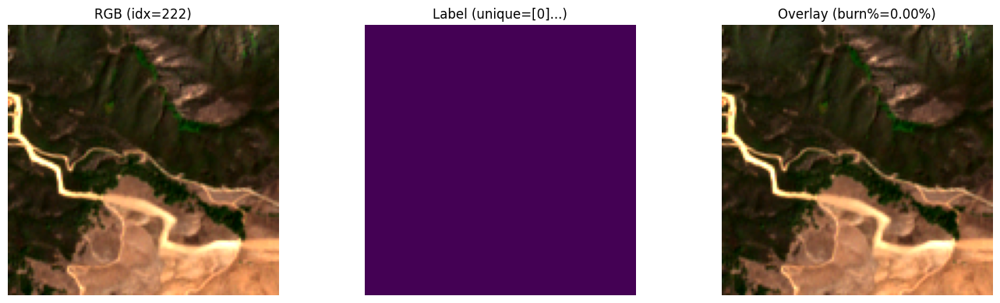

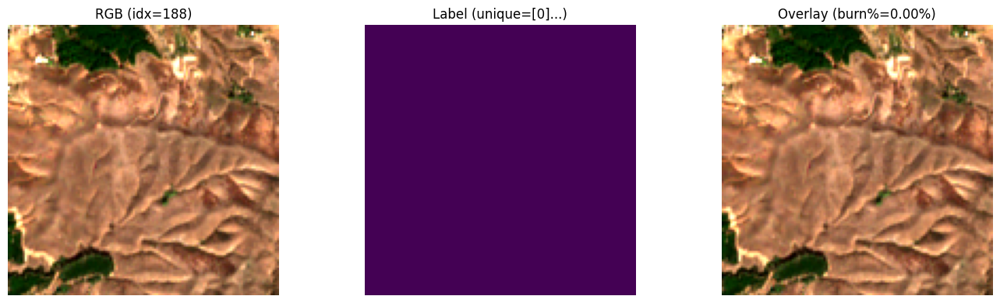

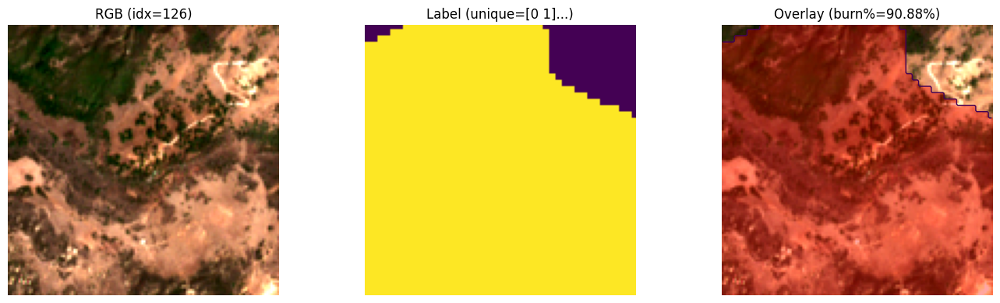

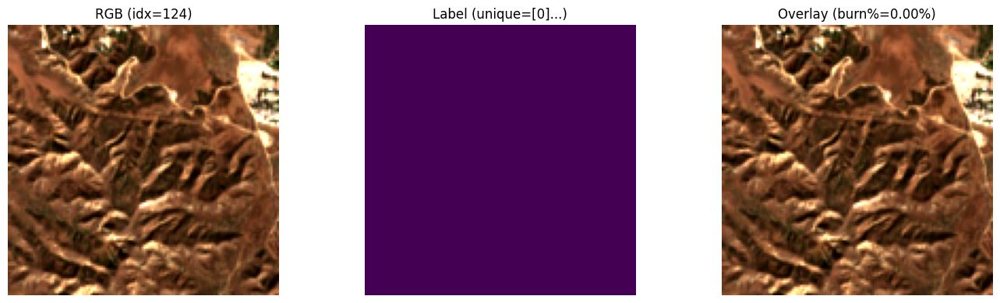

...

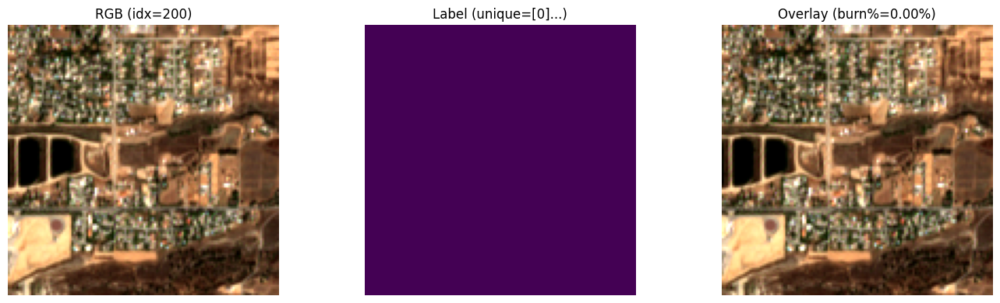

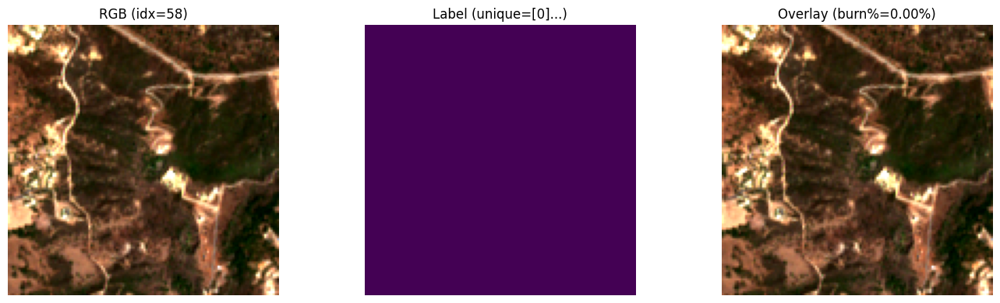

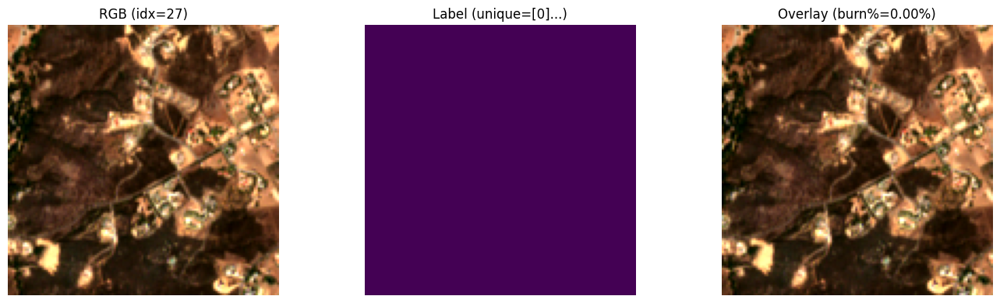

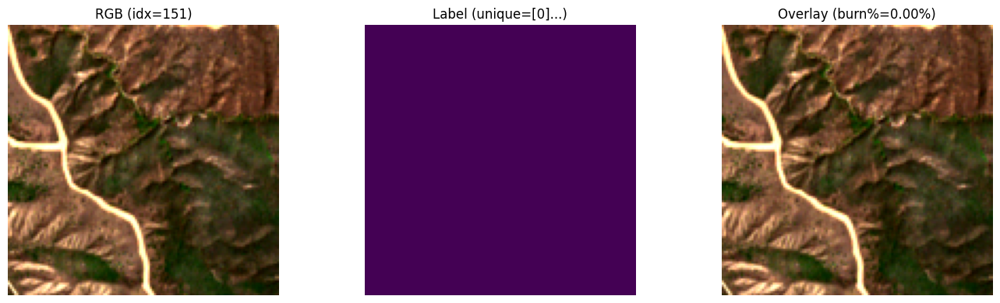

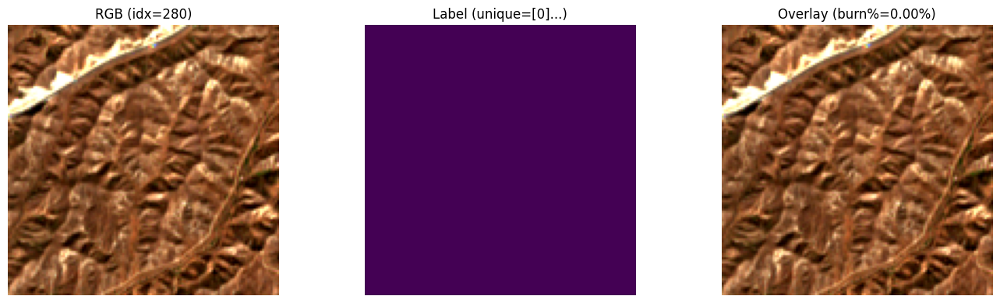

In [13]:
def inspect_random(dataset, n=12, rgb_idx=(3,2,1), seed=0):
    rng = np.random.default_rng(seed)
    idxs = rng.integers(0, len(dataset.samples), size=n)
    for i in idxs:
        show_sample_overlay(dataset, int(i), rgb_idx=rgb_idx)

inspect_random(ds_train, n=12, rgb_idx=(3,2,1), seed=42)